<a href="https://colab.research.google.com/github/Ping-YUAN/heartbeat-analysis-ai/blob/DataViz_MIT_Sepideh/notebooks/data_research_mit.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Check enviroment**
Set data_path to make this notebooks works well not only on local but also on Google drive


In [1]:
import sys
import os
data_path = ''
# Check if the environment is Google Colab
if 'google.colab' in sys.modules:
    print("Running on Google Colab")
    # Install required libraries
    !pip install tensorflow -q
    !pip install keras -q
    !pip install scikit-learn -q
    !pip install pandas -q
    !pip install numpy -q
    !pip install matplotlib -q
    !pip install umap-learn -q
    %pip install lightgbm
    %pip install xgboost

    # Mount Google Drive
    from google.colab import drive
    drive.mount('/content/drive')
    # set the path where the csv file stored in your own google drive.
    data_path = '/content/drive/MyDrive/Heartbeat_Project/'

else:
    print("Running on local environment")

    current_path = os.getcwd()
    print("Current working directory:", current_path)
    data_path = '../data/raw/'

Path = dict({
    'mitbih_test': data_path +  'mitbih_test.csv',
    'mitbih_train': data_path +  'mitbih_train.csv',
    'mitbih_train_clean': data_path +  'mitbih_train_clean.csv',
    'mitbih_test_clean': data_path +  'mitbih_test_clean.csv',
})

Running on local environment
Current working directory: /Users/pingyuan/Documents/codeself/heartbeat-analysis-ai/notebooks


# **Import the necessary packages and define the paths:**

In [2]:
# Verify installation and import libraries
import tensorflow as tf
import keras
import sklearn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px
from matplotlib.colors import ListedColormap
from sklearn.manifold import TSNE
from sklearn.manifold import Isomap
import umap
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import f1_score
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.ensemble import BalancedRandomForestClassifier

# **Define the necessary functions:**

In [3]:
def addColumnsToDataframe(df):
    """
    As the dataset is composed with 188 columns with the 188th columns as the category values,
    so we give the last column the name 'target', others named with 'c_0 to c_186'
    """
    num_columns= df.shape[1]
    feature_col_name = ['c_' + str(i) for i in range(0, num_columns - 1)]
    df_columns = feature_col_name + ['target']
    df.columns = df_columns
    return df

def convertColumnAsInt(df, column):
    """
    As the category value is in float type. We want to get the int to identify the category.
    """
    df[column] = df[column].astype(int)
    return df


def getBarChartFromCategoryValueCounts(category_value_counts):
    """
    We call the plot over the pandas series object to plot the category count values
    """

    # Sample data
    categories = category_value_counts.index
    values = category_value_counts.values
    colors = ['green', 'gray', 'red', 'yellow', 'orange']  # Replace with desired colors
    labels = ['Normal', 'Unclassified','Ventricular', 'Supraventricular', 'Fusion']  # Replace with corresponding labels

    plt.figure(figsize=(8, 5))

    # Plot each bar with a unique color and label
    bars = plt.bar(range(len(categories)), values, color=colors)  # Use range(len(categories)) as x-coordinates

    plt.title('Category Count Values')
    plt.xlabel('Categories')
    plt.ylabel('Count')
    plt.grid(False)

    # Set the custom tick labels
    plt.xticks(range(len(categories)), categories, rotation=360)

    # Add a legend
    plt.legend(bars, labels, title='Legend Title')  # Associate bars with labels

    # Label each bar with its count value
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height}', ha='center', va='bottom')

    plt.show()

def plot_overlay_ecg_signals(df, label, color):
    # Define a function to plot overlay of ECG signals for a single class from both datasets

    # Extract data rows for the specified class label
    class_data = df[df['target'] == label]

    # Check if there is any data for the specified class label
    if class_data.empty:
        print(f"No data found for class {label}")
        return

    # Extract a sample data row (first row) for the specified class label
    sample_data = class_data.iloc[0]

    # Plot the sample ECG signal, excluding the 'target' column
    plt.plot(sample_data[:-1], label=label, color=color)

def apply_pca_to_dataset(df, n_components=2):

    X = df.drop(columns=['target'])
    y = df['target']

    # Standardize the features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Apply PCA
    pca = PCA(n_components=n_components)
    X_pca = pca.fit_transform(X_scaled)

    # Create a DataFrame with the principal components
    principal_components = [f'Principal Component {i+1}' for i in range(n_components)]
    df_pca = pd.DataFrame(data=X_pca, columns=principal_components)
    df_pca['target'] = y

    return df_pca, pca

def plot_pca_results(df_pca, title='PCA Results'):

    # Convert categorical labels to numerical values
    unique_labels = df_pca['target'].unique()
    label_to_number = {label: number for number, label in enumerate(unique_labels)}
    color_sequence = df_pca['target'].map(label_to_number)

    # Define the discrete color scale
    color_discrete_scale = ['green', 'yellow', 'red', 'orange', 'gray']

    # Create a ListedColormap object with the defined colors
    cmap = ListedColormap(color_discrete_scale[:len(unique_labels)])

    # Scatter plot of the first two principal components
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(df_pca['Principal Component 1'], df_pca['Principal Component 2'],
                          c=color_sequence, cmap=cmap, alpha=0.5)
    plt.title(title)
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')

    # Create a colorbar with the correct labels
    cbar = plt.colorbar(scatter, ticks=np.arange(len(unique_labels)))
    cbar.set_label('Class')
    cbar.set_ticklabels(unique_labels)

    plt.show()

def plot_3d_pca(df_pca, title='3D PCA Results'):

    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')


    x = df_pca.iloc[:, 0]
    y = df_pca.iloc[:, 1]
    z = df_pca.iloc[:, 2]

    # Convert categorical labels to numerical values for coloring
    unique_labels = df_pca['target'].unique()
    label_to_number = {label: number for number, label in enumerate(unique_labels)}
    colors = df_pca['target'].map(label_to_number)

    scatter = ax.scatter(x, y, z, c=colors, cmap='viridis', depthshade=True)


    cbar = plt.colorbar(scatter, ticks=range(len(unique_labels)))
    cbar.set_label('Class')
    cbar.set_ticklabels(unique_labels)

    ax.set_title(title)
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_zlabel('Principal Component 3')

    plt.show()

# **Read the CSV files of the MIT-BIH Arrhythmia Dataset:**

In [4]:
# MIT Train
mitbih_train = pd.read_csv(Path.get('mitbih_train'), header=None)
mitbih_train_with_columns = addColumnsToDataframe(mitbih_train)
mitbih_train_with_columns = convertColumnAsInt(mitbih_train_with_columns, 'target')

# MIT Test
mitbih_test = pd.read_csv(Path.get('mitbih_test'), header=None)
mitbih_test_with_columns = addColumnsToDataframe(mitbih_test)
mitbih_test_with_columns = convertColumnAsInt(mitbih_test_with_columns, 'target')

# **First information about both datasets:**

In [5]:
# MIT train Info:

print('The MIT train dataset has', mitbih_train.shape[0], 'rows and', mitbih_train.shape[1], 'columns.\n'
      'Each row represents a single heartbeat, and each column from c-0 to c-186 contains a datapoint for one heartbeat.', '\n'
      'the percentage of missing values is', mitbih_train.isnull().mean().mean() * 100, '\n'
      'Number of rows duplicated :',  mitbih_train.duplicated().sum())

# MIT test Info:
print('\n\nThe MIT test dataset has', mitbih_test.shape[0], 'rows and', mitbih_test.shape[1], 'columns.\n'
      'Each row represents a single heartbeat, and each column from c-0 to c-186 contains a datapoint for one heartbeat.', '\n'
      'the percentage of missing values is', mitbih_test.isnull().mean().mean() * 100, '\n'
      'Number of rows duplicated :',  mitbih_test.duplicated().sum())

print("\n\nThe both datasets have no missing values and have 5 different categories:\n Normal, Supraventricular, Ventricular, Fusion, Unclassifiable")
print("\n\nThe features are numeric. All columns have the type float64, while the target column is int32.")

The MIT train dataset has 87554 rows and 188 columns.
Each row represents a single heartbeat, and each column from c-0 to c-186 contains a datapoint for one heartbeat. 
the percentage of missing values is 0.0 
Number of rows duplicated : 0


The MIT test dataset has 21892 rows and 188 columns.
Each row represents a single heartbeat, and each column from c-0 to c-186 contains a datapoint for one heartbeat. 
the percentage of missing values is 0.0 
Number of rows duplicated : 0


The both datasets have no missing values and have 5 different categories:
 Normal, Supraventricular, Ventricular, Fusion, Unclassifiable


The features are numeric. All columns have the type float64, while the target column is int32.


# **Plot the category count values**

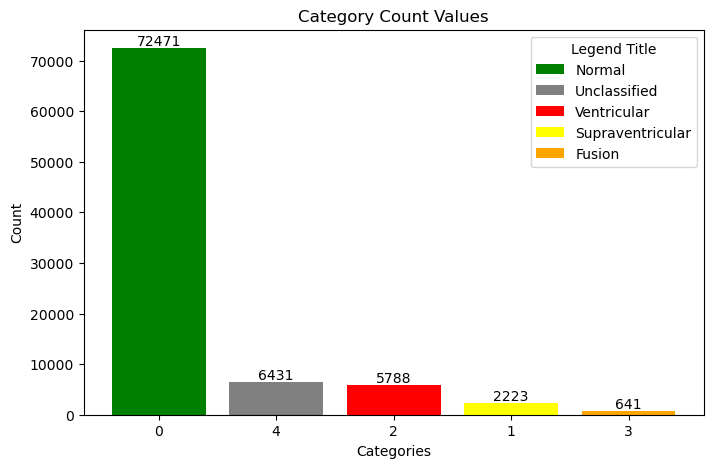

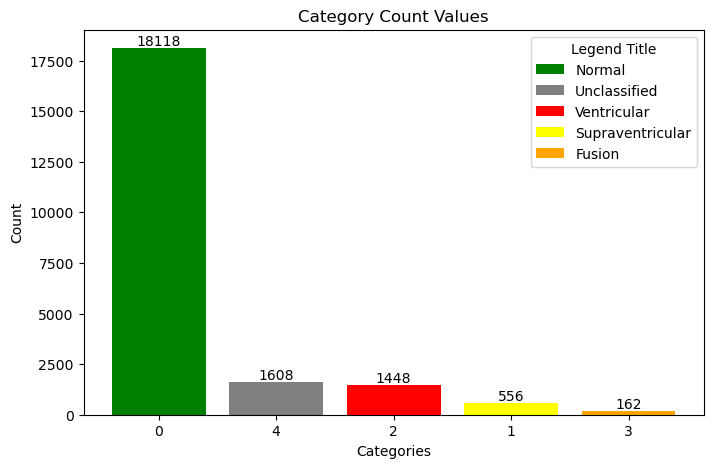

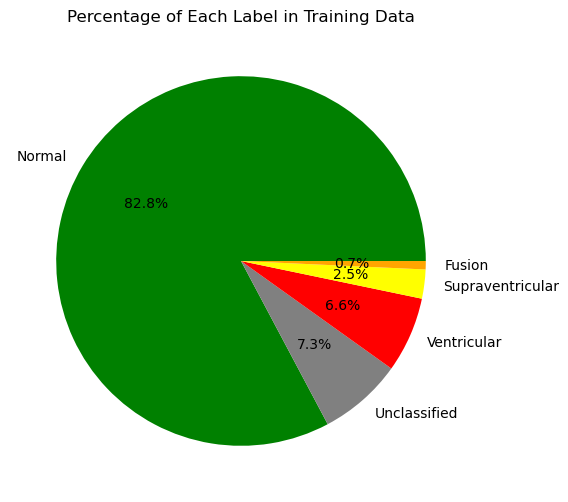

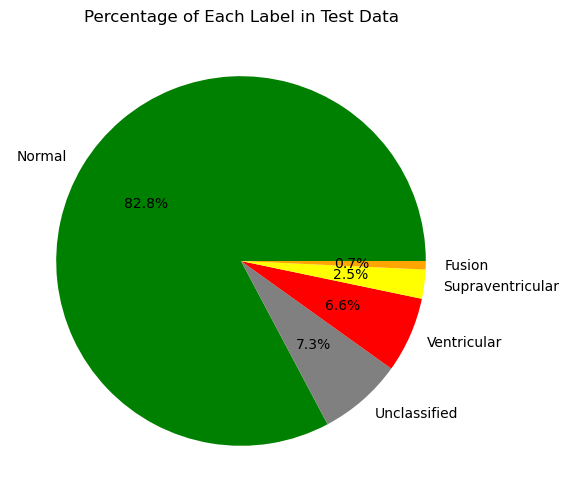

In [6]:
getBarChartFromCategoryValueCounts(mitbih_train_with_columns['target'].value_counts())
getBarChartFromCategoryValueCounts(mitbih_test_with_columns['target'].value_counts())

label_counts = mitbih_train_with_columns['target'].value_counts(normalize=True)
colors = ['green', 'gray', 'red', 'yellow', 'orange']  # Replace with desired colors
labels = ['Normal', 'Unclassified','Ventricular', 'Supraventricular', 'Fusion']


# Plot a pie chart
plt.figure(figsize=(10, 6))
plt.pie(label_counts, labels=labels, colors=colors, autopct='%1.1f%%')
plt.title('Percentage of Each Label in Training Data')
plt.show()

label_counts = mitbih_test_with_columns['target'].value_counts(normalize=True)
colors = ['green', 'gray', 'red', 'yellow', 'orange']  # Replace with desired colors
labels = ['Normal', 'Unclassified','Ventricular', 'Supraventricular', 'Fusion']

# Plot a pie chart
plt.figure(figsize=(10, 6))
plt.pie(label_counts, labels=labels, colors=colors, autopct='%1.1f%%')
plt.title('Percentage of Each Label in Test Data')
plt.show()


# **Convert target variable to categorical**

In [7]:
# Define your mapping dictionary
class_mapping = {
    0: 'Normal',
    1: 'Supraventricular',
    2: 'Ventricular',
    3: 'Fusion',
    4: 'Unclassifiable'
}

# Convert target variable to categorical in both training and test datasets
mitbih_train['target'] = mitbih_train['target'].map(class_mapping)
mitbih_test['target'] = mitbih_test['target'].map(class_mapping)

# display(mitbih_train.head())
# display(mitbih_test.head())


# **plot overlay of ECG signals from both datasets for a single class**

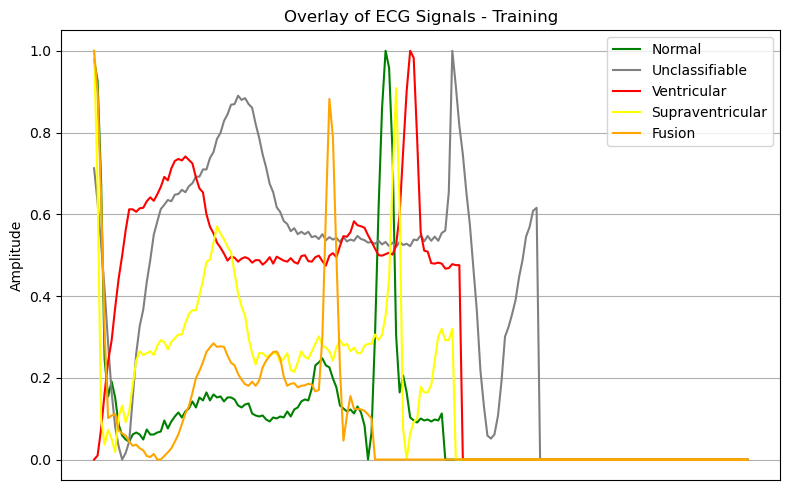

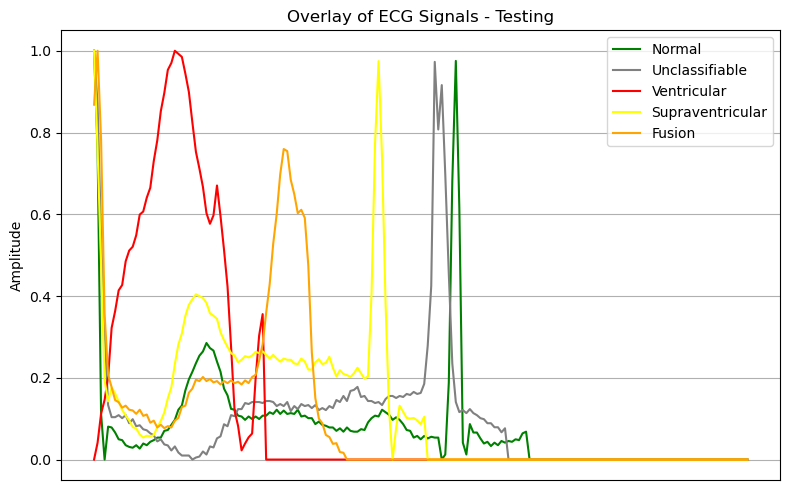

In [26]:
# Colors for each class
colors = ['green', 'gray', 'red', 'yellow', 'orange']

# Labels for each class
labels = ['Normal', 'Unclassifiable','Ventricular', 'Supraventricular', 'Fusion']

# Plotting overlay for each class in both datasets
plt.figure(figsize=(8, 5))

# Plotting for training dataset
for label, color in zip(labels, colors):
    plot_overlay_ecg_signals(mitbih_train, label, color)

plt.title("Overlay of ECG Signals - Training")
plt.ylabel('Amplitude')
plt.grid(True)
plt.xticks([])  # Remove x-axis ticks and labels
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 5))

# Plotting for testing dataset
for label, color in zip(labels, colors):
    plot_overlay_ecg_signals(mitbih_test, label, color)

plt.title("Overlay of ECG Signals - Testing")
plt.ylabel('Amplitude')
plt.grid(True)
plt.xticks([])  # Remove x-axis ticks and labels
plt.legend()
plt.tight_layout()
plt.show()


# **identify patterns and relationships between different heartbeats within the same class by using Correlation Matrix**

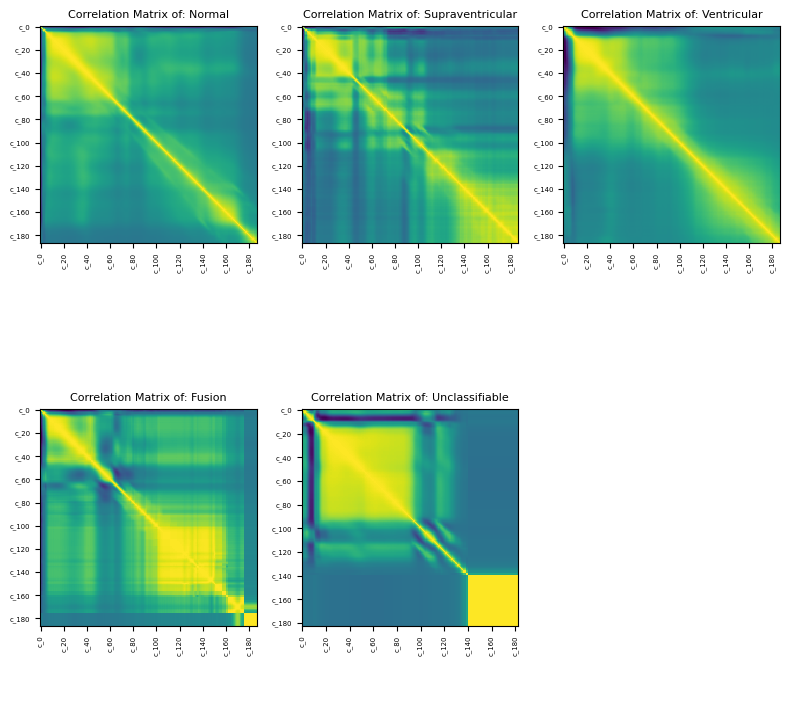

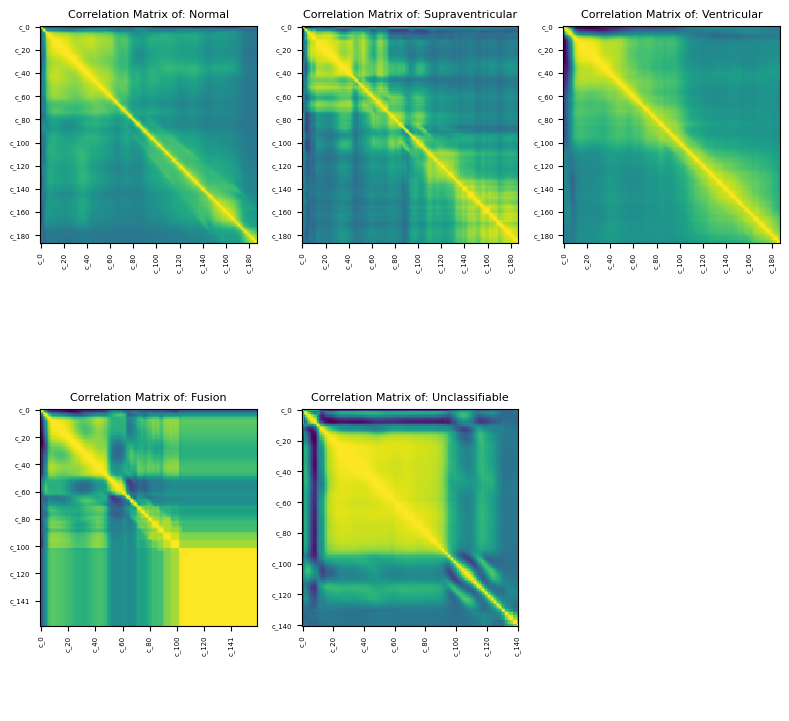

In [8]:

def plotCorrelationMatrixByClass(df, target, graphWidth=8, tick_frequency=20):
    # Ensure mitbih_train is a DataFrame and has at least 2 columns
    if not isinstance(df, pd.DataFrame) or df.shape[1] < 2:
        print(f'Error: Invalid DataFrame provided. Expected at least 2 columns.')
        return

    # Check if target column exists in the DataFrame
    if target not in df.columns:
        print(f'Error: Target variable "{target}" not found in DataFrame columns.')
        return

    # Exclude the target variable from the DataFrame
    df_without_target = df.drop(columns=[target])

    # Get unique classes of the target variable
    unique_classes = df[target].unique()


    fig, axs = plt.subplots(2, 3, figsize=(graphWidth, graphWidth))
    axs = axs.flatten()


    for i, cls in enumerate(unique_classes):
        if i >= 5:  # Only plot the first 5 classes
            break

        df_class = df_without_target[df[target] == cls]


        df_class = df_class.dropna(axis='columns', how='any')
        df_class = df_class[[col for col in df_class if df_class[col].nunique() > 1]]


        if df_class.shape[1] < 2:
            print(f'No correlation plots shown for class "{cls}": The number of non-NaN or constant columns ({df_class.shape[1]}) is less than 2')
            continue


        corr = df_class.corr()

        # Plot the correlation matrix in the current subplot
        axs[i].matshow(corr)

        # Set x and y tick labels every tick_frequency-th label
        axs[i].set_xticks(range(0, len(corr.columns), tick_frequency))
        axs[i].set_xticklabels(corr.columns[::tick_frequency], rotation=90,fontsize=5)
        axs[i].set_yticks(range(0, len(corr.columns), tick_frequency))
        axs[i].set_yticklabels(corr.columns[::tick_frequency],fontsize=5)

        axs[i].xaxis.tick_bottom()
        axs[i].set_title(f'Correlation Matrix of: {cls}', fontsize=8)

    if len(unique_classes) < 6:
        axs[-1].axis('off')

    plt.tight_layout()
    plt.show()

# training
plotCorrelationMatrixByClass(mitbih_train, target='target', graphWidth=8, tick_frequency=20)
# test
plotCorrelationMatrixByClass(mitbih_test, target='target', graphWidth=8, tick_frequency=20)

# **Perform Histogram**

4710615
4710615


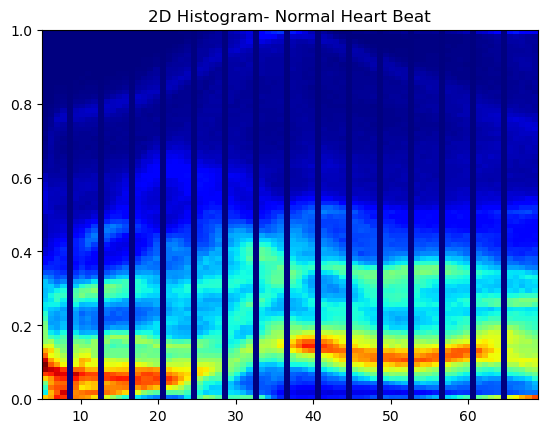

144495
144495


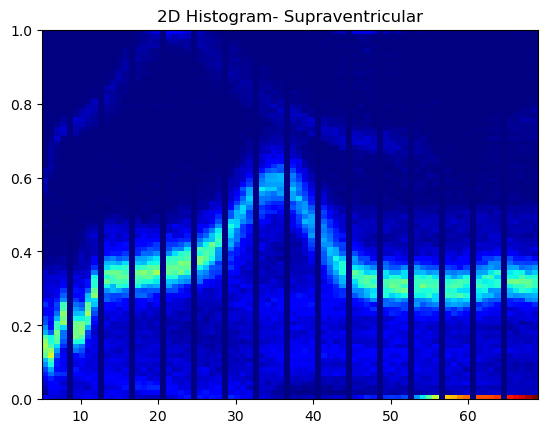

376220
376220


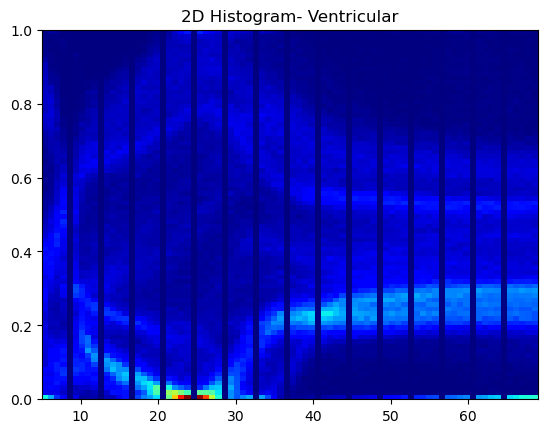

41665
41665


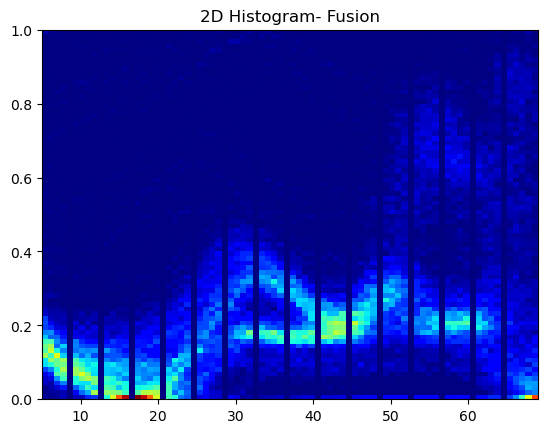

418015
418015


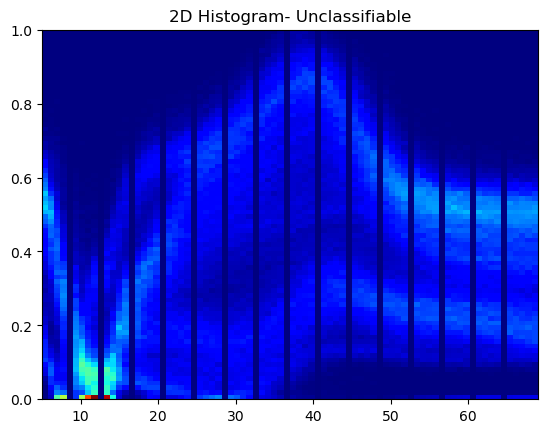

In [10]:
def plot_hist(class_name, min_val = 5, size = 70, title=''):
    img = mitbih_train.loc[mitbih_train['target']==class_name].values
    img = img[:, min_val: size]
    img_flatten = img.flatten()

    final1 = np.arange(min_val, size)
    for _ in range(img.shape[0]-1):
        tempo1 = np.arange(min_val, size)
        final1 = np.concatenate((final1, tempo1))
    print(len(final1))
    print(len(img_flatten))
    plt.hist2d(final1, img_flatten, bins=(80, 80), cmap=plt.cm.jet)
    plt.title('2D Histogram- '+title)

    plt.show()


plot_hist('Normal', title='Normal Heart Beat')
plot_hist('Supraventricular', title='Supraventricular')
plot_hist('Ventricular', title='Ventricular')
plot_hist('Fusion', title='Fusion')
plot_hist('Unclassifiable', title='Unclassifiable')

# **PCA Functions for training Dataset**

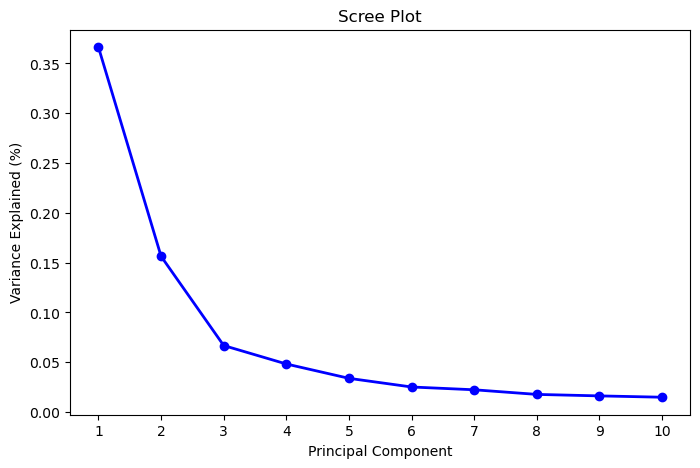

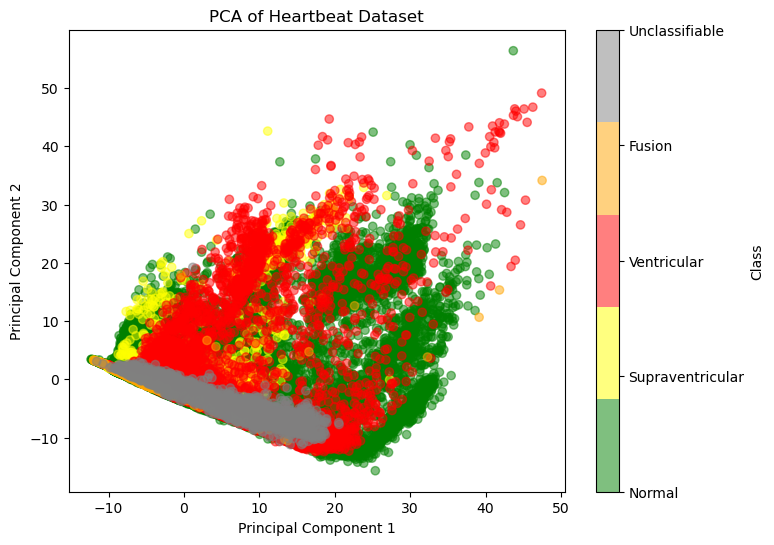

In [9]:
# find the best n_components for training
df_pca, pca = apply_pca_to_dataset(mitbih_train, n_components=10)

def create_scree_plot(pca, title='Scree Plot'):

    explained_var_ratio = pca.explained_variance_ratio_
    components = np.arange(len(explained_var_ratio)) + 1

    plt.figure(figsize=(8, 5))
    plt.plot(components, explained_var_ratio, 'o-', linewidth=2, color='blue')
    plt.title(title)
    plt.xlabel('Principal Component')
    plt.ylabel('Variance Explained (%)')
    plt.xticks(components)
    plt.show()

create_scree_plot(pca)

#Plot 2D
df_pca, pca = apply_pca_to_dataset(mitbih_train, n_components=2)
plot_pca_results(df_pca, title='PCA of Heartbeat Dataset')

# #Plot 3D
# df_pca, pca = apply_pca_to_dataset(mitbih_train, n_components=3)
# plot_3d_pca(df_pca, title='3D PCA of Heartbeat Dataset')

# plot 3D with rotation adjustment
df_pca, pca= apply_pca_to_dataset(mitbih_train, n_components=3)
color_discrete_scale = ['green', 'yellow', 'red', 'orange', 'gray']

fig = px.scatter_3d(df_pca, x='Principal Component 1', y='Principal Component 2', z='Principal Component 3',
                    color='target',
                    color_discrete_sequence=color_discrete_scale,
                    title='3D PCA of Heartbeat Dataset',
                    labels={'target': 'Class'}, opacity=0.5)
fig.update_traces(marker=dict(size=5))
fig.show()


# **PCA Functions for Test Dataset**

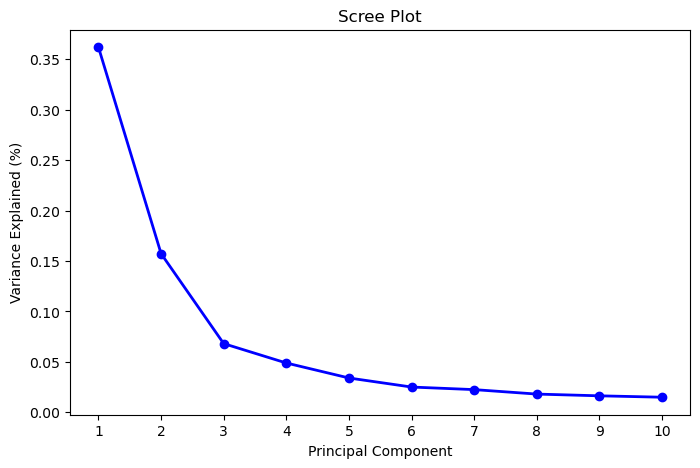

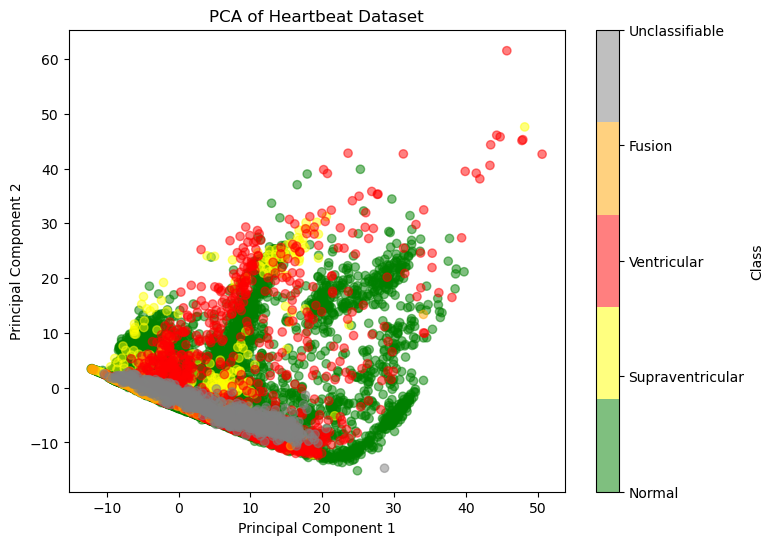

In [10]:
# find the best n_components for test
df_pca, pca = apply_pca_to_dataset(mitbih_test, n_components=10)

def create_scree_plot(pca, title='Scree Plot'):

    explained_var_ratio = pca.explained_variance_ratio_
    components = np.arange(len(explained_var_ratio)) + 1

    plt.figure(figsize=(8, 5))
    plt.plot(components, explained_var_ratio, 'o-', linewidth=2, color='blue')
    plt.title(title)
    plt.xlabel('Principal Component')
    plt.ylabel('Variance Explained (%)')
    plt.xticks(components)
    plt.show()

create_scree_plot(pca)

#Plot 2D
df_pca, pca = apply_pca_to_dataset(mitbih_test, n_components=2)
plot_pca_results(df_pca, title='PCA of Heartbeat Dataset')

# #Plot 3D
# df_pca, pca = apply_pca_to_dataset(mitbih_test, n_components=3)
# plot_3d_pca(df_pca, title='3D PCA of Heartbeat Dataset')

# plot 3D with rotation adjustment
df_pca, pca= apply_pca_to_dataset(mitbih_test, n_components=3)
color_discrete_scale = ['green', 'yellow', 'red', 'orange', 'gray']

fig = px.scatter_3d(df_pca, x='Principal Component 1', y='Principal Component 2', z='Principal Component 3',
                    color='target',
                    color_discrete_sequence=color_discrete_scale,
                    title='3D PCA of Heartbeat Dataset',
                    labels={'target': 'Class'}, opacity=0.5)
fig.update_traces(marker=dict(size=5))
fig.show()


# **Look at the loadings to determine which variables are most significant in each principal component in training data set**

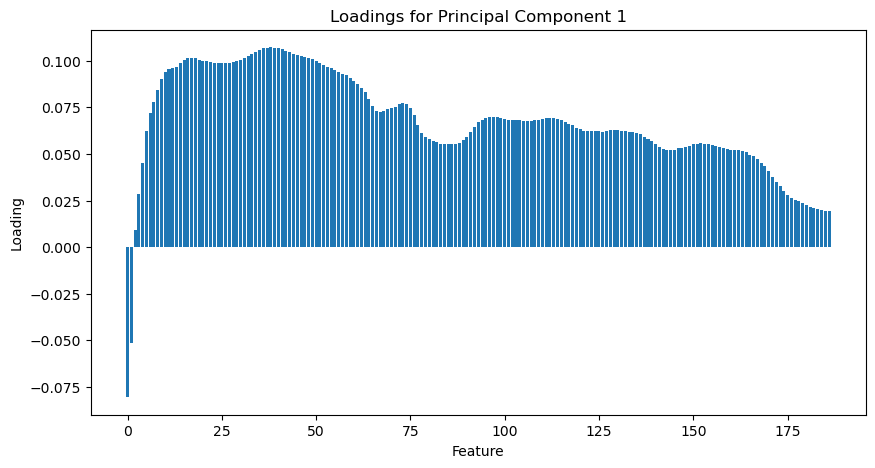

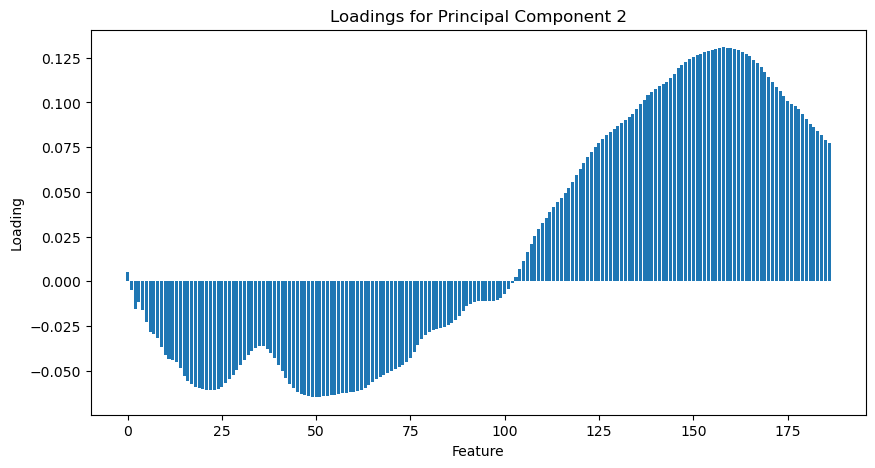

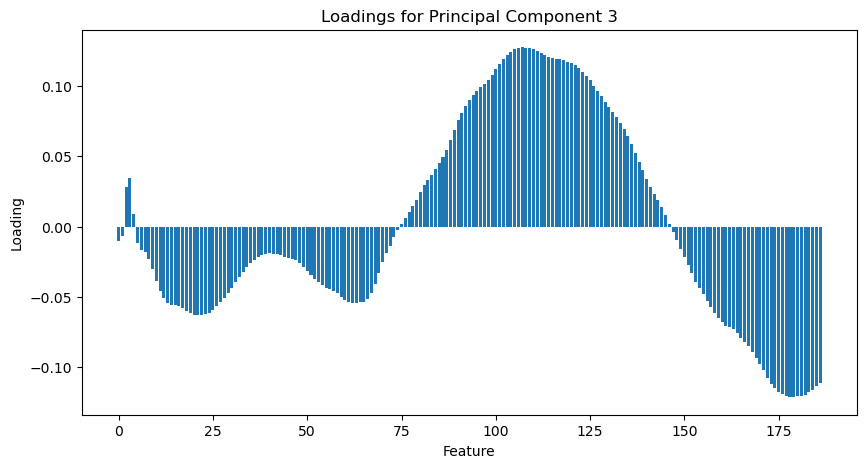

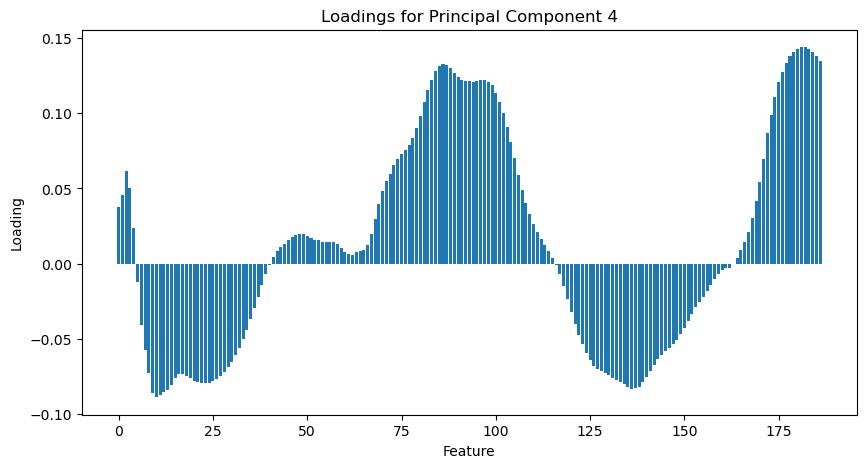

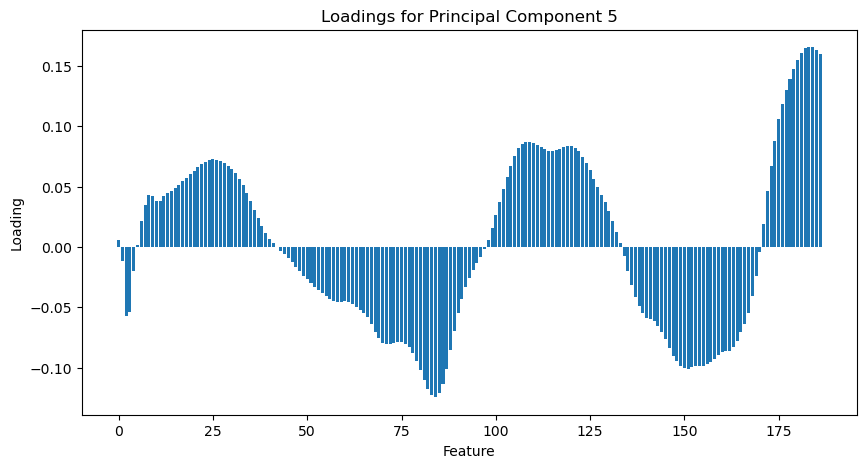

In [11]:
df_pca, pca = apply_pca_to_dataset(mitbih_train, n_components=5)


loadings = pca.components_


for i, component in enumerate(loadings):

    plt.figure(figsize=(10, 5))


    plt.bar(x=range(len(component)), height=component)


    plt.xlabel('Feature')
    plt.ylabel('Loading')
    plt.title(f'Loadings for Principal Component {i+1}')

    plt.show()
# loadings” refers to the weights or coefficients of the original variables in the principal components.
# They indicate how much each feature contributes to each principal component.

# **Look at the loadings to determine which variables are most significant in each principal component in training data set**

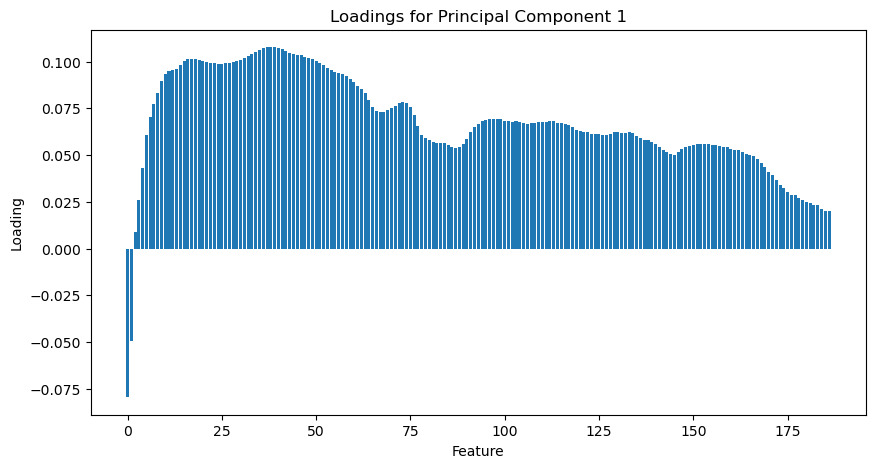

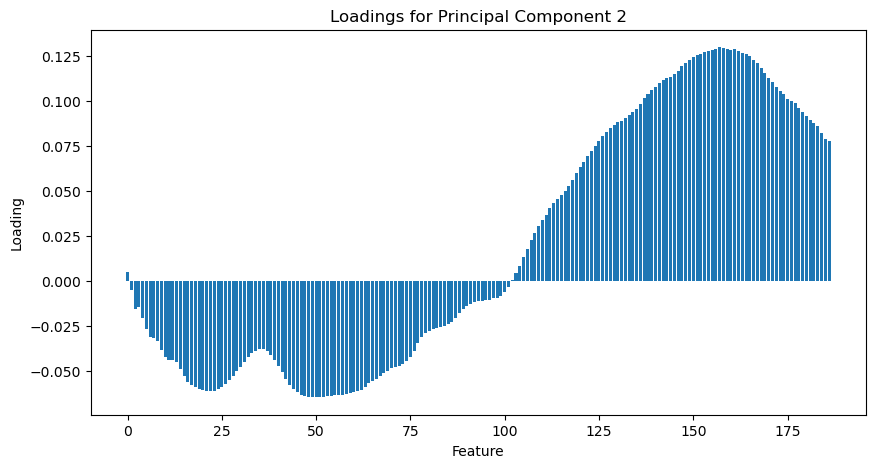

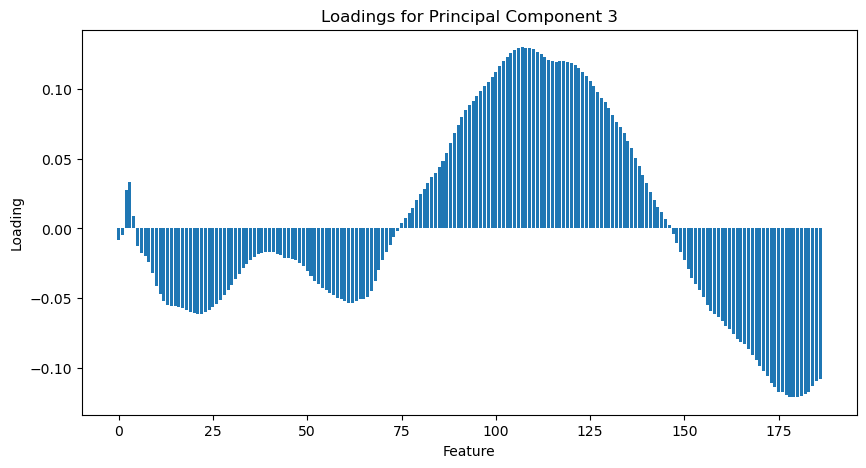

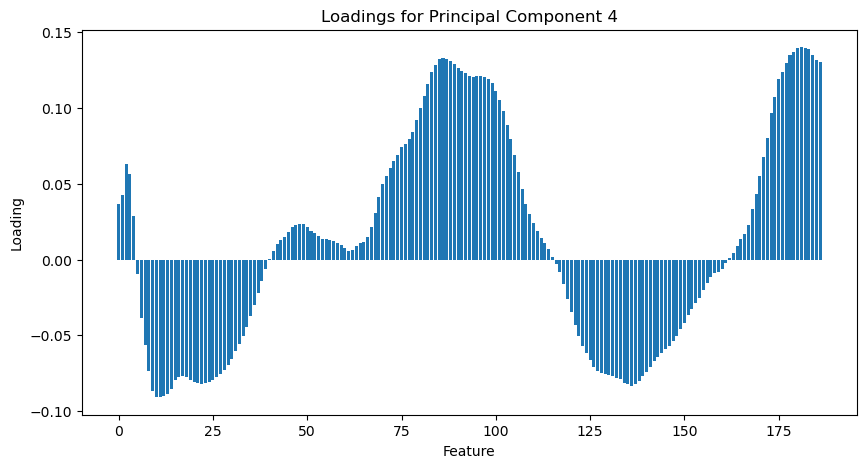

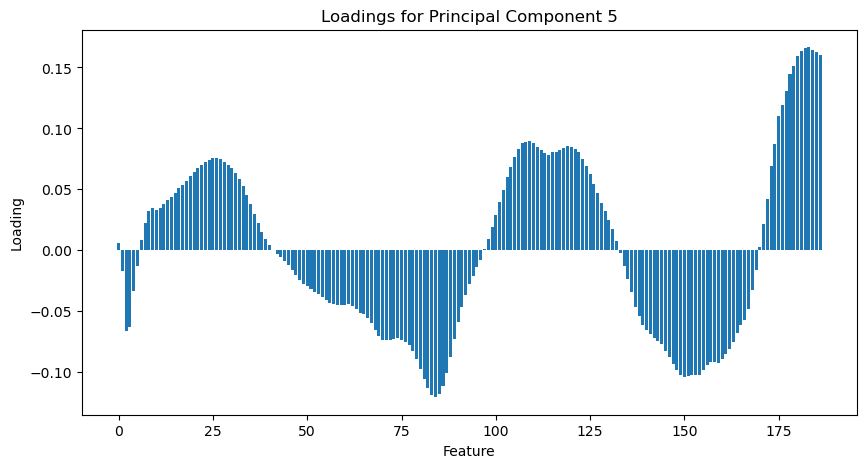

In [12]:
df_pca, pca = apply_pca_to_dataset(mitbih_test, n_components=5)


loadings = pca.components_


for i, component in enumerate(loadings):

    plt.figure(figsize=(10, 5))


    plt.bar(x=range(len(component)), height=component)


    plt.xlabel('Feature')
    plt.ylabel('Loading')
    plt.title(f'Loadings for Principal Component {i+1}')

    plt.show()
# loadings” refers to the weights or coefficients of the original variables in the principal components.
# They indicate how much each feature contributes to each principal component.

# **Identify significant features**

In [13]:
from scipy.stats import f_oneway, kruskal
# Separate features and labels
features = mitbih_train.iloc[:, :-1]
labels = mitbih_train['target']


p_values = []


for i in range(features.shape[1]):

    class_groups = [features[labels == label].iloc[:, i] for label in class_mapping.values()]

    # If normally distributed, use ANOVA
    # f_stat, p_val = f_oneway(*class_groups)

    # If not normally distributed, use Kruskal-Wallis H-test
    h_stat, p_val = kruskal(*class_groups)
    p_values.append(p_val)


adjusted_p_values = [p * len(p_values) for p in p_values]

# Select features with p-value below the significance level
significant_features = [i for i, p_val in enumerate(adjusted_p_values) if p_val < 0.05]

print(f'Number of significant features: {len(significant_features)}')
# print(f'Significant features: {significant_features}')

print('The absence of significant features suggests that the classes may not be well-separated in the original feature space,\n which could make it challenging for PCA and t-SNE to clearly distinguish between them')

Number of significant features: 187
The absence of significant features suggests that the classes may not be well-separated in the original feature space,
 which could make it challenging for PCA and t-SNE to clearly distinguish between them


# **Perform t_SNE in training set**

c:\Users\Isabell Gurstein\anaconda3\envs\project_env\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning:

Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.

  File "c:\Users\Isabell Gurstein\anaconda3\envs\project_env\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


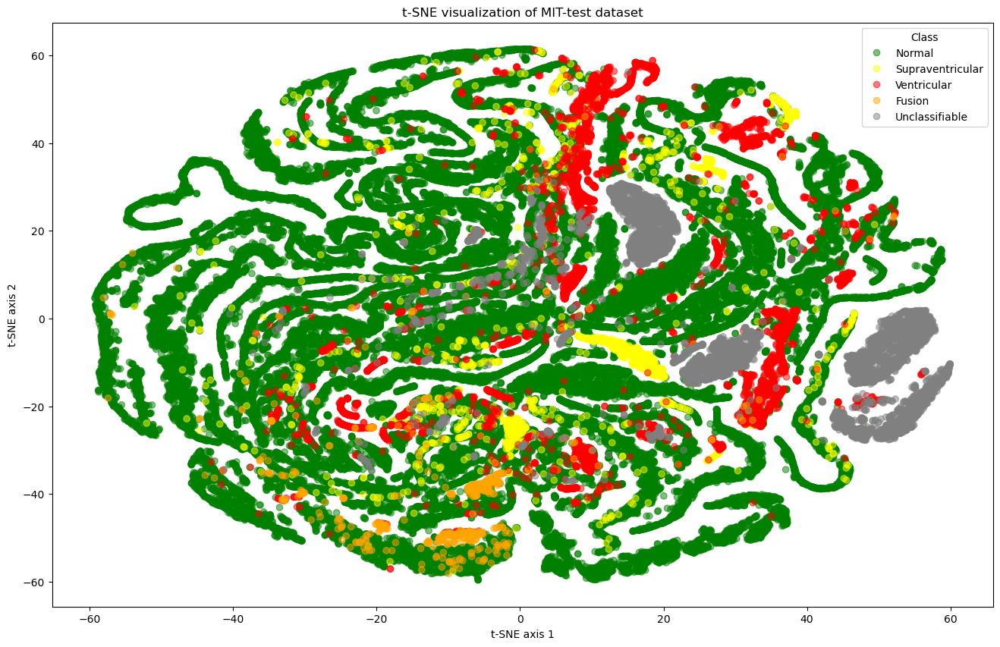

In [16]:
# Separate features and labels
features = mitbih_train.iloc[:, :-1]
labels = mitbih_train.iloc[:, -1]

# Reduce dimensionality with PCA
pca = PCA(n_components=50)
features_pca = pca.fit_transform(features)

# Initialize t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, random_state=42)

# Perform t-SNE
tsne_results = tsne.fit_transform(features_pca)

# Plot the results
plt.figure(figsize=(16,10))
unique_labels = labels.unique()
label_to_number = {label: number for number, label in enumerate(unique_labels)}
colors = labels.map(label_to_number)

# Define your discrete color scale
color_discrete_scale = ['green', 'yellow', 'red', 'orange', 'gray']

# Create a ListedColormap object with the defined colors
cmap = ListedColormap(color_discrete_scale[:len(unique_labels)])

scatter = plt.scatter(tsne_results[:,0], tsne_results[:,1], c=colors, cmap=cmap, alpha=0.5)
plt.title('t-SNE visualization of MIT-test dataset')
plt.xlabel('t-SNE axis 1')
plt.ylabel('t-SNE axis 2')

# Create a legend with the correct labels
handles, _ = scatter.legend_elements()
plt.legend(handles, unique_labels, title='Class')

plt.show()


# **Perform t_SNE in test set**

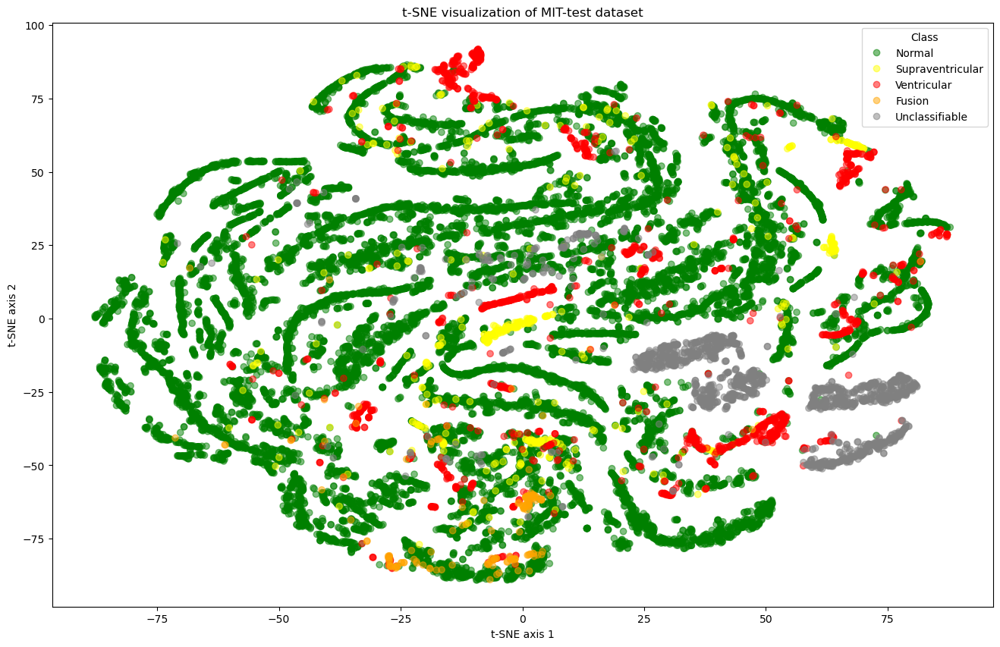

In [17]:
# Separate features and labels
features = mitbih_test.iloc[:, :-1]
labels = mitbih_test.iloc[:, -1]

# Reduce dimensionality with PCA
pca = PCA(n_components=50)
features_pca = pca.fit_transform(features)

# Initialize t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, random_state=42)

# Perform t-SNE
tsne_results = tsne.fit_transform(features_pca)

# Plot the results
plt.figure(figsize=(16,10))
unique_labels = labels.unique()
label_to_number = {label: number for number, label in enumerate(unique_labels)}
colors = labels.map(label_to_number)

# Define your discrete color scale
color_discrete_scale = ['green', 'yellow', 'red', 'orange', 'gray']

# Create a ListedColormap object with the defined colors
cmap = ListedColormap(color_discrete_scale[:len(unique_labels)])

scatter = plt.scatter(tsne_results[:,0], tsne_results[:,1], c=colors, cmap=cmap, alpha=0.5)
plt.title('t-SNE visualization of MIT-test dataset')
plt.xlabel('t-SNE axis 1')
plt.ylabel('t-SNE axis 2')

# Create a legend with the correct labels
handles, _ = scatter.legend_elements()
plt.legend(handles, unique_labels, title='Class')

plt.show()


# **Perform UMAP in Training set**

In [50]:
# from umap import UMAP

# features = mitbih_train.drop(columns=['target'])

# # Apply UMAP
# umap = UMAP(n_components=2, random_state=42)  # Set random_state for reproducibility
# df_umap = umap.fit_transform(features)

# # Plot the results
# plt.figure(figsize=(16,10))
# unique_labels = mitbih_train['target'].unique()
# label_to_number = {label: number for number, label in enumerate(unique_labels)}
# colors = mitbih_train['target'].map(label_to_number)

# plt.scatter(df_umap[:, 0], df_umap[:, 1], c=colors, cmap=cmap, alpha=0.5)
# plt.title('UMAP visualization of MIT-train dataset')
# plt.xlabel('UMAP axis 1')
# plt.ylabel('UMAP axis 2')
# plt.legend(handles=scatter.legend_elements()[0], labels=['Normal', 'Ventricular', 'Supraventricular', 'Fusion', 'Unclassifiable'])
# plt.show()



# **Perform UMAP in Test set**

In [49]:
# from umap import UMAP

# features = mitbih_test.drop(columns=['target'])

# # Apply UMAP
# umap = UMAP(n_components=2, random_state=42)  # Set random_state for reproducibility
# df_umap = umap.fit_transform(features)

# # Plot the results
# plt.figure(figsize=(16,10))
# unique_labels = mitbih_test['target'].unique()
# label_to_number = {label: number for number, label in enumerate(unique_labels)}
# colors = mitbih_test['target'].map(label_to_number)

# plt.scatter(df_umap[:, 0], df_umap[:, 1], c=colors, cmap=cmap, alpha=0.5)
# plt.title('UMAP visualization of MIT-train dataset')
# plt.xlabel('UMAP axis 1')
# plt.ylabel('UMAP axis 2')
# plt.legend(handles=scatter.legend_elements()[0], labels=['Normal', 'Ventricular', 'Supraventricular', 'Fusion', 'Unclassifiable'])
# plt.show()



# **Prepare Data for modeling and Preprocessing:**

In [16]:
# Drop rows where 'target' is 'Unclassifiable beat'
mitbih_train = mitbih_train[mitbih_train['target'] != 'Unclassifiable']
mitbih_test = mitbih_test[mitbih_test['target'] != 'Unclassifiable']

"""
Attention: name and color of each class is defined as follows:
0: 'Normal',
1: 'Supraventricular',
2: 'Ventricular',
3: 'Fusion',
4: 'Unclassifiable'

color_discrete_scale = ['green', 'yellow', 'red', 'orange', 'gray']

Attention: we can use following colormap for represent our data to have a same Viz
cmap = ListedColormap(color_discrete_scale[:len(unique_labels)])
"""
# Combine abnormal categories
mitbih_train['target'] = mitbih_train['target'].replace(['Supraventricular', 'Ventricular', 'Fusion'], 'abnormal')
mitbih_test['target'] = mitbih_test['target'].replace(['Supraventricular', 'Ventricular', 'Fusion'], 'abnormal')

# Encode the labels: normal as 0, abnormal as 1
mitbih_train['target'] = mitbih_train['target'].replace({'Normal': 0, 'abnormal': 1})
mitbih_test['target'] = mitbih_test['target'].replace({'Normal': 0, 'abnormal': 1})

# save this cleaned data.
mitbih_train.to_csv(Path.get('mitbih_train_clean'), index=False)
mitbih_test.to_csv(Path.get('mitbih_test_clean'), index=False)



# **load our cleaned data and Split them**

Class distribution in training
 target
0    0.893347
1    0.106653
Name: proportion, dtype: float64


Class distribution in Test
 target
0    0.893216
1    0.106784
Name: proportion, dtype: float64





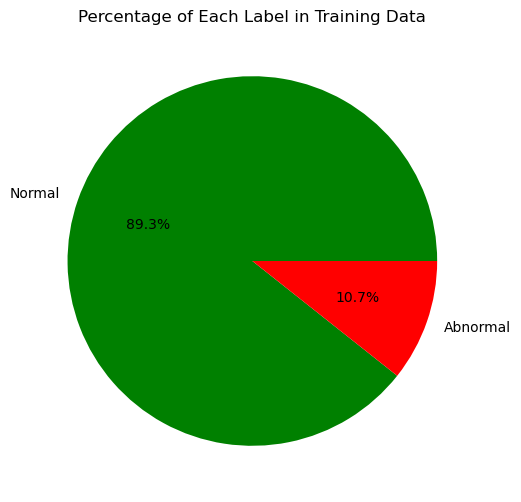

In [15]:
mitbih_train = pd.read_csv(Path.get('mitbih_train_clean'), header=0)
mitbih_test = pd.read_csv(Path.get('mitbih_test_clean'), header=0)

# Show the distribution of the two classes
print('Class distribution in training\n',mitbih_train['target'].value_counts(normalize=True))
print('\n\nClass distribution in Test\n',mitbih_test['target'].value_counts(normalize=True))
print('\n\n')

label_counts = mitbih_train['target'].value_counts(normalize=True)
colors = ['green', 'red']
labels = ['Normal', 'Abnormal']

# Plot a pie chart
plt.figure(figsize=(10, 6))
plt.pie(label_counts, labels=labels, colors=colors, autopct='%1.1f%%')
plt.title('Percentage of Each Label in Training Data')
plt.show()

# after appling any redampling method on our training data, we should split our data to features(X), target(y) and train and test data. in our dataset we have train and test data then we should only define our X,y
# split the training and test data to X,y
X_train= mitbih_train.drop(columns=['target'])
y_train = mitbih_train['target']

X_test = mitbih_test.drop(columns=['target'])
y_test = mitbih_test['target']


In [31]:
from scipy.stats import kstest

# to find the distribution of our variables, follow the normal distribution or not
normal_vars = []
non_normal_vars = []

for i in range(187):  # 0 to 186
    stat, p = kstest(X_train.iloc[:, i], 'norm')
    if p > 0.05:
        normal_vars.append(f'Variable {i}')
    else:
        non_normal_vars.append(f'Variable {i}')

print("Variables following normal distribution:")
print(normal_vars)
if len(non_normal_vars) == 187:
    print("All variables not following normal distribution, then we can decide that MinMaxScalar or RobustScalar could be the best scaling method")

# create a grid of Q-Q plots, to visualize the distribution of all variables

# num_vars = 187
# num_cols = 6  # Number of columns in the grid
# num_rows = num_vars // num_cols + (num_vars % num_cols > 0)

# fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 3))

# for i in range(num_vars):
#     row = i // num_cols
#     col = i % num_cols
#     ax = axes[row, col]
#     stats.probplot(X_train.iloc[:, i], dist="norm", plot=ax)
#     ax.set_title(f'Variable {i}')

# # Hide any empty subplots
# for j in range(i + 1, num_rows * num_cols):
#     fig.delaxes(axes.flatten()[j])

# plt.tight_layout()
# plt.show()


Variables following normal distribution:
[]
All variables not following normal distribution, then we can decide that MinMaxScalar or RobustScalar could be the best scaling method


# **Find the best Rescaling**

In [32]:
from sklearn.tree import DecisionTreeClassifier

# Rescaling ensures that all features contribute equally to the model, preventing features with larger ranges from dominating the learning process
# Define recommended scalers
scalers = {
    "StandardScaler": StandardScaler(),
    "MinMaxScaler": MinMaxScaler(),
    "RobustScaler": RobustScaler()
}

# Define base models to evaluate
models = {
    "LogisticRegression": LogisticRegression(class_weight='balanced', max_iter=1000),
    "Tree": DecisionTreeClassifier(class_weight='balanced', random_state=42),
    #"SVM": SVC(class_weight='balanced', probability=True, random_state=42), # SVM is computationally too expensive, after 80 minutes, it was still running!!!
    "KNN": KNeighborsClassifier(n_neighbors=5, weights='distance', n_jobs=-1)
}

def evaluate_scalers(X, y, scalers, models):
    results = {}
    for scaler_name, scaler in scalers.items():
        print(f"Scaler: {scaler_name}", end="\n\n")
        X_scaled = scaler.fit_transform(X)

        skf = StratifiedKFold(n_splits=5)

        for model_name, model in models.items():
            f_score = []
            print(f"Model: {model_name}", end="\n\n")

            for train_index, test_index in skf.split(X_scaled, y):
                X_train_, y_train_ = X_scaled[train_index], y[train_index]
                X_test_, y_test_ = X_scaled[test_index], y[test_index]

                model.fit(X_train_, y_train_)

                y_pred_ = model.predict(X_test_)

                f_score.append(f1_score(y_test_, y_pred_))

            mean_f1_score = np.mean(f_score)
            print("The scores: ", end="\n\n")
            print([round(f, 2) for f in f_score], end="\n\n")
            print('F1-Score mean=%.5f' % (mean_f1_score), end="\n\n")

            if scaler_name not in results:
                results[scaler_name] = {}
            results[scaler_name][model_name] = mean_f1_score
    return results

# Apply evaluation
results = evaluate_scalers(X_train, y_train, scalers, models)
# Summarize the results
for scaler_name, model_scores in results.items():
    print(f"Scaler: {scaler_name}")
    for model_name, score in model_scores.items():
        print(f"  Model: {model_name}, F1-Score mean: {score:.5f}")
    print("\n")


Scaler: StandardScaler

Model: LogisticRegression

The scores: 

[0.18, 0.46, 0.5, 0.48, 0.42]

F1-Score mean=0.40887

Model: Tree

The scores: 

[0.66, 0.83, 0.85, 0.85, 0.72]

F1-Score mean=0.78093

Model: KNN



c:\Users\Isabell Gurstein\anaconda3\envs\project_env\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\Users\Isabell Gurstein\anaconda3\envs\project_env\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


The scores: 

[0.74, 0.89, 0.91, 0.92, 0.77]

F1-Score mean=0.84705

Scaler: MinMaxScaler

Model: LogisticRegression

The scores: 

[0.17, 0.47, 0.5, 0.48, 0.42]

F1-Score mean=0.40824

Model: Tree

The scores: 

[0.66, 0.83, 0.85, 0.85, 0.72]

F1-Score mean=0.78093

Model: KNN

The scores: 

[0.74, 0.9, 0.93, 0.93, 0.78]

F1-Score mean=0.85536

Scaler: RobustScaler

Model: LogisticRegression

The scores: 

[0.18, 0.46, 0.5, 0.48, 0.42]

F1-Score mean=0.40907

Model: Tree

The scores: 

[0.66, 0.83, 0.85, 0.85, 0.72]

F1-Score mean=0.78093

Model: KNN

The scores: 

[0.74, 0.88, 0.92, 0.92, 0.77]

F1-Score mean=0.84558

Scaler: StandardScaler
  Model: LogisticRegression, F1-Score mean: 0.40887
  Model: Tree, F1-Score mean: 0.78093
  Model: KNN, F1-Score mean: 0.84705


Scaler: MinMaxScaler
  Model: LogisticRegression, F1-Score mean: 0.40824
  Model: Tree, F1-Score mean: 0.78093
  Model: KNN, F1-Score mean: 0.85536


Scaler: RobustScaler
  Model: LogisticRegression, F1-Score mean: 0.409

# **Apply the best rescaling method**

In [33]:
# Determine the best scaler based on the highest average F1-score
best_scaler_name = max(results, key=lambda k: np.mean(list(results[k].values())))
best_scaler = scalers[best_scaler_name]
print(f"Best Scaler: {best_scaler_name}")

scaler = MinMaxScaler()
# Fit the scaler on the training data and transform it
X_train_scaled = scaler.fit_transform(X_train)
# Transform the test data using the same scaler
X_test_scaled = scaler.transform(X_test)


# Convert the numpy arrays to pandas DataFrames
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)


Best Scaler: MinMaxScaler


# **find the best resampling**

In [34]:
# When dealing with imbalanced datasets, especially those that reflect real-world scenarios,
# it’s important to use both resampling methods and appropriate loss functions to improve model performance.

def crossvalidation(X, y, models):
    resampling_methods = {
        "SMOTE": SMOTE(),
        "Oversampling": RandomOverSampler(sampling_strategy='not majority'),
        "Undersampling": RandomUnderSampler(sampling_strategy='majority'),
    }

    skf = StratifiedKFold(n_splits=5)
    results = {}

    for name, resample in resampling_methods.items():
        print(name, end="\n\n")
        results[name] = {}

        for model_name, model in models.items():
            f_score = []
            print(f"Model: {model_name}", end="\n\n")

            for train_index, test_index in skf.split(X, y):
                X_train_, y_train_ = X.loc[train_index], y.loc[train_index]
                X_test_, y_test_ = X.loc[test_index], y.loc[test_index]

                if name == "BalancedRandomForest":
                    model.fit(X_train_, y_train_)
                else:
                    X_train_resampled, y_train_resampled = resample.fit_resample(X_train_, y_train_)
                    model.fit(X_train_resampled, y_train_resampled)

                y_pred_ = model.predict(X_test_)

                f_score.append(f1_score(y_test_, y_pred_))

            results[name][model_name] = np.mean(f_score)
            print("The scores: ", end="\n\n")
            print([round(f, 2) for f in f_score], end="\n\n")
            print('F1-Score mean=%.5f' % (np.mean(f_score)), end="\n\n")

    return results, resampling_methods

models = {
    "LogisticRegression": LogisticRegression(class_weight='balanced', max_iter=1000),
    "Tree": DecisionTreeClassifier(class_weight='balanced', random_state=42),
    #"SVM": SVC(class_weight='balanced', probability=True, random_state=42),
    "KNN": KNeighborsClassifier(n_neighbors=5, weights='distance', n_jobs=-1)
}

# Apply cross-validation with resampling
results_resample, resampling_methods = crossvalidation(X_train_scaled, y_train, models)

# Check F1-Scores: Look at the F1-scores for each resampling method across different models.
# Choose the Best: The resampling method with the highest average F1-score and balanced performance across all models is usually the best choice for dealing with class imbalance in your dataset.
# Balanced performance across all models means that a resampling method consistently improves the performance of different models, not just one. Here’s how you can think about it:


SMOTE

Model: LogisticRegression

The scores: 

[0.18, 0.47, 0.5, 0.48, 0.42]

F1-Score mean=0.40753

Model: Tree

The scores: 

[0.68, 0.79, 0.8, 0.81, 0.72]

F1-Score mean=0.75988

Model: KNN

The scores: 

[0.76, 0.85, 0.87, 0.87, 0.77]

F1-Score mean=0.82377

Oversampling

Model: LogisticRegression

The scores: 

[0.17, 0.46, 0.5, 0.48, 0.42]

F1-Score mean=0.40761

Model: Tree

The scores: 

[0.68, 0.83, 0.85, 0.84, 0.74]

F1-Score mean=0.78846

Model: KNN

The scores: 

[0.77, 0.87, 0.88, 0.89, 0.77]

F1-Score mean=0.83530

Undersampling

Model: LogisticRegression

The scores: 

[0.16, 0.47, 0.5, 0.49, 0.42]

F1-Score mean=0.40659

Model: Tree

The scores: 

[0.58, 0.64, 0.67, 0.65, 0.59]

F1-Score mean=0.62606

Model: KNN

The scores: 

[0.7, 0.78, 0.8, 0.8, 0.68]

F1-Score mean=0.75247



# **Find and Apply the best Resampling method**

In [35]:
# Compare results
print("Results with Resampling:")
print(results_resample)

# Determine the best resampling method
best_method = max(results_resample, key=lambda k: np.mean(list(results_resample[k].values())))
print(f"\nBest Resampling Method: {best_method}")

# Apply the best resampling method to the entire dataset
best_resampler = resampling_methods[best_method]
X_train_resampled, y_train_resampled = best_resampler.fit_resample(X_train_scaled, y_train)

Results with Resampling:
{'SMOTE': {'LogisticRegression': 0.40752572834129347, 'Tree': 0.7598793001724666, 'KNN': 0.8237716487218133}, 'Oversampling': {'LogisticRegression': 0.4076109909966645, 'Tree': 0.7884584517246063, 'KNN': 0.8353016599698483}, 'Undersampling': {'LogisticRegression': 0.4065892481101939, 'Tree': 0.6260601932493234, 'KNN': 0.7524726176156113}}

Best Resampling Method: Oversampling


In [36]:
# Compare results
print("Results with Resampling:")
for method, result in results_resample.items(): 
    print(f"{method}: {result}")

# Determine the best resampling method
best_method = max(results_resample, key=lambda k: np.mean(list(results_resample[k].values())))
print(f"\nBest Resampling Method: {best_method}")

# Determine the best performing model under the best resampling method
best_model = max(results_resample[best_method], key=results_resample[best_method].get)
best_score = results_resample[best_method][best_model]

print(f"\nBest Performing Model: {best_model} with a score of {best_score:.4f} using the {best_method} resampling method.")

# Apply the best resampling method to the entire dataset
best_resampler = resampling_methods[best_method]

Results with Resampling:
SMOTE: {'LogisticRegression': 0.40752572834129347, 'Tree': 0.7598793001724666, 'KNN': 0.8237716487218133}
Oversampling: {'LogisticRegression': 0.4076109909966645, 'Tree': 0.7884584517246063, 'KNN': 0.8353016599698483}
Undersampling: {'LogisticRegression': 0.4065892481101939, 'Tree': 0.6260601932493234, 'KNN': 0.7524726176156113}

Best Resampling Method: Oversampling

Best Performing Model: KNN with a score of 0.8353 using the Oversampling resampling method.


# Same process for Ensamble Models
but without Scaling since we apply only tree-based models which do not need scaling and without Sampling because Ensamble models have their own strategies

In [37]:
# Define ensemble models to evaluate
ensemble_models = {
    "Balanced Random Forest": RandomForestClassifier(n_estimators=50, max_depth=5, class_weight='balanced', random_state=42), 
    "Gradient Boosting": GradientBoostingClassifier(n_estimators=50, max_depth=3, random_state=42), 
    "XGBoost": XGBClassifier(n_estimators=50, max_depth=3, eval_metric='mlogloss', use_label_encoder=False, random_state=42),
    "LightGBM": LGBMClassifier(n_estimators=50, max_depth=3, class_weight='balanced', random_state=42)
}

# Evaluate ensemble models without scaling or resampling
def evaluate_models(X, y, models):
    results = {}
    skf = StratifiedKFold(n_splits=5)

    for model_name, model in models.items():
        f_score = []
        print(f"Model: {model_name}", end="\n\n")

        for train_index, test_index in skf.split(X, y):
            X_train_, y_train_ = X.loc[train_index], y.loc[train_index]
            X_test_, y_test_ = X.loc[test_index], y.loc[test_index]

            model.fit(X_train_, y_train_)

            y_pred_ = model.predict(X_test_)

            f_score.append(f1_score(y_test_, y_pred_))

        mean_f1_score = np.mean(f_score)
        print("The scores: ", end="\n\n")
        print([round(f, 2) for f in f_score], end="\n\n")
        print('F1-Score mean=%.5f' % (mean_f1_score), end="\n\n")

        results[model_name] = mean_f1_score
    return results

# Apply evaluation without resampling
results_ensemble = evaluate_models(X_train, y_train, ensemble_models)

# Summarize the results
for model_name, score in results_ensemble.items():
    print(f"Model: {model_name}, F1-Score mean: {score:.5f}")
print("\n")

Model: Balanced Random Forest

The scores: 

[0.47, 0.68, 0.72, 0.68, 0.57]

F1-Score mean=0.62332

Model: Gradient Boosting

The scores: 

[0.21, 0.78, 0.84, 0.82, 0.63]

F1-Score mean=0.65523

Model: XGBoost



c:\Users\Isabell Gurstein\anaconda3\envs\project_env\Lib\site-packages\xgboost\core.py:158: UserWarning: [12:48:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\Isabell Gurstein\anaconda3\envs\project_env\Lib\site-packages\xgboost\core.py:158: UserWarning: [12:49:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\Isabell Gurstein\anaconda3\envs\project_env\Lib\site-packages\xgboost\core.py:158: UserWarning: [12:50:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not u

The scores: 

[0.55, 0.83, 0.89, 0.87, 0.75]

F1-Score mean=0.77892

Model: LightGBM

[LightGBM] [Info] Number of positive: 6922, number of negative: 57976
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 5.995896 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 47429
[LightGBM] [Info] Number of data points in the train set: 64898, number of used features: 187
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

In [38]:
# Summarize the results
print("Results for Ensamble Models on PTB:")
for model_name, score in results_ensemble.items():
    print(f"Model: {model_name}, F1-Score mean: {score:.5f}")
print("\n")

# Determine the best performing model
best_model = max(results_ensemble, key=results_ensemble.get)
best_score = results_ensemble[best_model]
print(f"The best performing model is: {best_model} with an F1-Score of {best_score:.5f}")

Results for Ensamble Models on PTB:
Model: Balanced Random Forest, F1-Score mean: 0.62332
Model: Gradient Boosting, F1-Score mean: 0.65523
Model: XGBoost, F1-Score mean: 0.77892
Model: LightGBM, F1-Score mean: 0.65683


The best performing model is: XGBoost with an F1-Score of 0.77892
